In [65]:
!pip install linearmodels
!pip install matplotlib
!pip install xlrd
!pip install openpyxl

You should consider upgrading via the 'C:\Users\arika\Documents\opinnot\uva\python\venv\Scripts\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\arika\Documents\opinnot\uva\python\venv\Scripts\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\arika\Documents\opinnot\uva\python\venv\Scripts\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'C:\Users\arika\Documents\opinnot\uva\python\venv\Scripts\python.exe -m pip install --upgrade pip' command.


# Sources
* [Panel data regression](https://towardsdatascience.com/a-guide-to-panel-data-regression-theoretics-and-implementation-with-python-4c84c5055cf8)
* [How to build a pooled OLS regression model for panel datasets](https://towardsdatascience.com/how-to-build-a-pooled-ols-regression-model-for-panel-data-sets-a78358f9c2a)
* [Pandas for panel data](https://python.quantecon.org/pandas_panel.html)


In [2]:
import pandas as pd
from linearmodels import PooledOLS
import statsmodels.api as sm

# Descriptive statistics about state-owned and privately owned banks

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [11]:
df = pd.read_excel('RIFA-Data2016.xls', sheet_name="Bank lending")

In [12]:
df

,Bank,Year,STATE_SHARE,LOANS,ASSETS,DEPOSITS_ASSETS,PROFIT_BT_ASSETS,COST_TO_INCOME,EQUITY_ASSETS,LLOSS_RES_ON_GLOANS
0,201,2005,63.760000,6.209636e+07,8.731443e+07,0.830049,3.486552,51.613,0.091945,4.950
1,201,2006,63.800000,9.652529e+07,1.316570e+08,0.828939,3.144802,54.839,0.088997,3.817
2,201,2007,60.300000,1.597618e+08,2.007972e+08,0.803022,2.835351,55.434,0.129280,2.764
3,201,2008,61.580000,1.728323e+08,2.292849e+08,0.756741,1.928618,49.997,0.130086,3.831
4,201,2009,60.750000,1.608252e+08,2.349233e+08,0.790621,0.420320,34.302,0.127377,10.651
5,201,2010,60.300000,1.801163e+08,2.831169e+08,0.806509,2.667141,41.937,0.114407,11.346
6,201,2011,60.300000,2.397713e+08,3.365345e+08,0.803734,3.651845,48.098,0.117024,7.903
7,202,2005,99.900000,2.033875e+07,3.748806e+07,0.615941,1.927711,49.095,0.143466,2.967
8,202,2006,99.900000,3.264960e+07,5.847458e+07,0.613496,2.682341,47.711,0.133403,3.220
9,202,2007,77.500000,7.008009e+07,1.108400e+08,0.560334,1.955379,46.385,0.178153,2.450


In [13]:
# Select rows, where state-ownership is 100
state_owned = df['STATE_SHARE'] == 0
count = state_owned.value_counts()[True]
print(count)


1893


In [14]:
df.head()

,Bank,Year,STATE_SHARE,LOANS,ASSETS,DEPOSITS_ASSETS,PROFIT_BT_ASSETS,COST_TO_INCOME,EQUITY_ASSETS,LLOSS_RES_ON_GLOANS
0,201,2005,63.76,6.209636e+07,8.731443e+07,0.830049,3.486552,51.613,0.091945,4.950
1,201,2006,63.80,9.652529e+07,1.316570e+08,0.828939,3.144802,54.839,0.088997,3.817
2,201,2007,60.30,1.597618e+08,2.007972e+08,0.803022,2.835351,55.434,0.129280,2.764
3,201,2008,61.58,1.728323e+08,2.292849e+08,0.756741,1.928618,49.997,0.130086,3.831
4,201,2009,60.75,1.608252e+08,2.349233e+08,0.790621,0.420320,34.302,0.127377,10.651


## Descriptive statistics
* [Example](https://towardsdatascience.com/working-with-multi-index-pandas-dataframes-f64d2e2c3e02)

In [8]:
df_desc = df.groupby(['Bank', 'Year'])

In [10]:
df_desc

In [1]:
df_desc

NameError: name 'df_desc' is not defined

In [35]:
# df_desc = df.groupby(['Bank', 'Year']).agg(
#     {
#         'STATE_SHARE': ['mean', 'min', 'max'],
#         'LOANS': ['mean', 'min', 'max'],
#         'ASSETS': ['mean', 'min', 'max'],
#         'DEPOSITS_ASSETS': ['mean', 'min', 'max'],
#         'PROFIT_BT_ASSETS': ['mean', 'min', 'max'],
#         'COST_TO_INCOME': ['mean', 'min', 'max'],
#         'EQUITY_ASSETS': ['mean', 'min', 'max'],
#         'LLOSS_RES_ON_GLOANS': ['mean', 'min', 'max'],
#     }
# )
# #df_desc

In [39]:
# level 0
df_desc.columns.get_level_values(1)
# level 1
df_desc.columns.get_level_values(1)

Index(['mean', 'min', 'max', 'mean', 'min', 'max', 'mean', 'min', 'max',
       'mean', 'min', 'max', 'mean', 'min', 'max', 'mean', 'min', 'max',
       'mean', 'min', 'max', 'mean', 'min', 'max'],
      dtype='object')

In [40]:
df_desc['ASSETS']

mean           min           max
Bank Year                                          
201  2005  8.731443e+07  8.731443e+07  8.731443e+07
     2006  1.316570e+08  1.316570e+08  1.316570e+08
     2007  2.007972e+08  2.007972e+08  2.007972e+08
     2008  2.292849e+08  2.292849e+08  2.292849e+08
     2009  2.349233e+08  2.349233e+08  2.349233e+08
     2010  2.831169e+08  2.831169e+08  2.831169e+08
     2011  3.365345e+08  3.365345e+08  3.365345e+08
202  2005  3.748806e+07  3.748806e+07  3.748806e+07
     2006  5.847458e+07  5.847458e+07  5.847458e+07
     2007  1.108400e+08  1.108400e+08  1.108400e+08
     2008  1.258458e+08  1.258458e+08  1.258458e+08
     2009  1.193882e+08  1.193882e+08  1.193882e+08
     2010  1.407919e+08  1.407919e+08  1.407919e+08
     2011  2.108827e+08  2.108827e+08  2.108827e+08
203  2005  1.534537e+07  1.534537e+07  1.534537e+07
     2006  2.942247e+07  2.942247e+07  2.942247e+07
     2007  3.864236e+07  3.864236e+07  3.864236e+07
     2009  5.756945e+07  5.756945e+07  5.756945e+07
     2010  6.403607e+07  6.403607e+07  6.403607e+07
     2011  7.695553e+07  7.695553e+07  7.695553e+07
204  2005  1.981583e+06  1.981583e+06  1.981583e+06
     2006  7.009984e+06  7.009984e+06  7.009984e+06
     2007  1.452201e+07  1.452201e+07  1.452201e+07
     2008  2.427176e+07  2.427176e+07  2.427176e+07
     2009  2.746523e+07  2.746523e+07  2.746523e+07
     2010  3.054116e+07  3.054116e+07  3.054116e+07
     2011  3.989384e+07  3.989384e+07  3.989384e+07
205  2005  1.791255e+06  1.791255e+06  1.791255e+06
     2006  6.040211e+06  6.040211e+06  6.040211e+06
     2007  1.301166e+07  1.301166e+07  1.301166e+07
     2008  2.030201e+07  2.030201e+07  2.030201e+07
     2009  2.357387e+07  2.357387e+07  2.357387e+07
     2010  2.966368e+07  2.966368e+07  2.966368e+07
     2011  3.655694e+07  3.655694e+07  3.655694e+07
207  2005  8.538849e+06  8.538849e+06  8.538849e+06
     2006  1.450596e+07  1.450596e+07  1.450596e+07
     2007  2.151397e+07  2.151397e+07  2.151397e+07
     2008  2.727619e+07  2.727619e+07  2.727619e+07
     2009  2.728490e+07  2.728490e+07  2.728490e+07
     2011  3.292353e+07  3.292353e+07  3.292353e+07
208  2006  9.376737e+06  9.376737e+06  9.376737e+06
     2007  1.499015e+07  1.499015e+07  1.499015e+07
     2008  2.027746e+07  2.027746e+07  2.027746e+07
     2009  1.594730e+07  1.594730e+07  1.594730e+07
     2010  1.886696e+07  1.886696e+07  1.886696e+07
     2011  2.397734e+07  2.397734e+07  2.397734e+07
209  2005  7.402297e+06  7.402297e+06  7.402297e+06
     2006  1.115926e+07  1.115926e+07  1.115926e+07
     2007  1.662429e+07  1.662429e+07  1.662429e+07
     2008  1.724119e+07  1.724119e+07  1.724119e+07
     2009  1.525955e+07  1.525955e+07  1.525955e+07
     2010  1.491697e+07  1.491697e+07  1.491697e+07
     2011  2.315532e+07  2.315532e+07  2.315532e+07
210  2005  2.971149e+06  2.971149e+06  2.971149e+06
     2006  4.158759e+06  4.158759e+06  4.158759e+06
     2007  8.107161e+06  8.107161e+06  8.107161e+06
     2008  9.455120e+06  9.455120e+06  9.455120e+06
     2009  9.162454e+06  9.162454e+06  9.162454e+06
     2010  1.739733e+07  1.739733e+07  1.739733e+07
     2011  2.056597e+07  2.056597e+07  2.056597e+07
211  2005  4.694603e+06  4.694603e+06  4.694603e+06
     2006  1.136357e+07  1.136357e+07  1.136357e+07
     2007  1.809779e+07  1.809779e+07  1.809779e+07
     2008  2.107935e+07  2.107935e+07  2.107935e+07
     2009  1.695057e+07  1.695057e+07  1.695057e+07
     2010  1.667836e+07  1.667836e+07  1.667836e+07
     2011  1.879378e+07  1.879378e+07  1.879378e+07
212  2005  3.854356e+06  3.854356e+06  3.854356e+06
     2006  6.856413e+06  6.856413e+06  6.856413e+06
     2007  1.194667e+07  1.194667e+07  1.194667e+07
     2008  1.571800e+07  1.571800e+07  1.571800e+07
     2009  1.558022e+07  1.558022e+07  1.558022e+07
     2010  1.558974e+07  1.558974e+07  1.558974e+07
     2011  1.747273e+07  1.747273e+07  1.747273e+07
213  2005  1.942997e+06  1.942997e+06  1.942997e+06
     2006  3.17

In [42]:
df_desc.index

MultiIndex([(201, 2005),
            (201, 2006),
            (201, 2007),
            (201, 2008),
            (201, 2009),
            (201, 2010),
            (201, 2011),
            (202, 2005),
            (202, 2006),
            (202, 2007),
            ...
            (547, 2005),
            (547, 2006),
            (547, 2007),
            (547, 2008),
            (547, 2009),
            (547, 2010),
            (548, 2008),
            (548, 2009),
            (548, 2010),
            (548, 2011)],
           names=['Bank', 'Year'], length=2033)

In [43]:
# Get level valous
df_desc.index.get_level_values(0)     # level-0


Int64Index([201, 201, 201, 201, 201, 201, 201, 202, 202, 202,
            ...
            547, 547, 547, 547, 547, 547, 548, 548, 548, 548],
           dtype='int64', name='Bank', length=2033)

In [47]:
df_desc.head()

STATE_SHARE                       LOANS                              \
                 mean    min    max          mean           min           max   
Bank Year                                                                       
201  2005       63.76  63.76  63.76  6.209636e+07  6.209636e+07  6.209636e+07   
     2006       63.80  63.80  63.80  9.652529e+07  9.652529e+07  9.652529e+07   
     2007       60.30  60.30  60.30  1.597618e+08  1.597618e+08  1.597618e+08   
     2008       61.58  61.58  61.58  1.728323e+08  1.728323e+08  1.728323e+08   
     2009       60.75  60.75  60.75  1.608252e+08  1.608252e+08  1.608252e+08   

                 ASSETS                             DEPOSITS_ASSETS            \
                   mean           min           max            mean       min   
Bank Year                                                                       
201  2005  8.731443e+07  8.731443e+07  8.731443e+07        0.830049  0.830049   
     2006  1.316570e+08  1.316570e+08  1.316570e+08        0.828939  0.828939   
     2007  2.007972e+08  2.007972e+08  2.007972e+08        0.803022  0.803022   
     2008  2.292849e+08  2.292849e+08  2.292849e+08        0.756741  0.756741   
     2009  2.349233e+08  2.349233e+08  2.349233e+08        0.790621  0.790621   

                    PROFIT_BT_ASSETS                     COST_TO_INCOME  \
                max             mean       min       max           mean   
Bank Year                                                                 
201  2005  0.830049         3.486552  3.486552  3.486552         51.613   
     2006  0.828939         3.144802  3.144802  3.144802         54.839   
     2007  0.803022         2.835351  2.835351  2.835351         55.434   
     2008  0.756741         1.928618  1.928618  1.928618         49.997   
     2009  0.790621         0.420320  0.420320  0.420320         34.302   

                          EQUITY_ASSETS                      \
              min     max          mean       min       max   
Bank Year                                                     
201  2005  51.613  51.613      0.091945  0.091945  0.091945   
     2006  54.839  54.839      0.088997  0.088997  0.088997   
     2007  55.434  55.434      0.129280  0.129280  0.129280   
     2008  49.997  49.997      0.130086  0.130086  0.130086   
     2009  34.302  34.302      0.127377  0.127377  0.127377   

          LLOSS_RES_ON_GLOANS                  
                         mean     min     max  
Bank Year                                      
201  2005               4.950   4.950   4.950  
     2006               3.817   3.817   3.817  
     2007               2.764   2.764   2.764  
     2008               3.831   3.831   3.831  
     2009              10.651  10.651  10.651

In [46]:
# df_desc2.groupby(level=0).mean()

STATE_SHARE                                 LOANS                \
            mean         min         max          mean           min   
Bank                                                                   
201    61.541429   61.541429   61.541429  1.531327e+08  1.531327e+08   
202    85.894286   85.894286   85.894286  7.306095e+07  7.306095e+07   
203    22.131377   22.131377   22.131377  2.257546e+07  2.257546e+07   
204   100.000000  100.000000  100.000000  1.495878e+07  1.495878e+07   
205    84.041261   84.041261   84.041261  1.173089e+07  1.173089e+07   
207    50.042683   50.042683   50.042683  1.467956e+07  1.467956e+07   
208     0.000000    0.000000    0.000000  1.156438e+07  1.156438e+07   
209     0.000000    0.000000    0.000000  9.282085e+06  9.282085e+06   
210     0.000000    0.000000    0.000000  6.696103e+06  6.696103e+06   
211     0.000000    0.000000    0.000000  9.086947e+06  9.086947e+06   
212     0.000000    0.000000    0.000000  8.134319e+06  8.134319e+06   
213    73.250719   73.250719   73.250719  4.771934e+06  4.771934e+06   
214     0.000000    0.000000    0.000000  8.528410e+06  8.528410e+06   
215     0.000000    0.000000    0.000000  7.812936e+06  7.812936e+06   
216     0.000000    0.000000    0.000000  6.399981e+06  6.399981e+06   
217     0.000000    0.000000    0.000000  4.083841e+06  4.083841e+06   
218     9.655714    9.655714    9.655714  4.311531e+06  4.311531e+06   
219     0.000000    0.000000    0.000000  1.996767e+06  1.996767e+06   
220     0.000000    0.000000    0.000000  3.213349e+06  3.213349e+06   
221     0.000000    0.000000    0.000000  3.455772e+06  3.455772e+06   
222     0.000000    0.000000    0.000000  1.982731e+06  1.982731e+06   
223     0.000000    0.000000    0.000000  1.129279e+06  1.129279e+06   
224    63.938333   63.938333   63.938333  2.435255e+06  2.435255e+06   
225     0.000000    0.000000    0.000000  2.791173e+06  2.791173e+06   
226    49.750000   49.750000   49.750000  1.981719e+06  1.981719e+06   
227     0.000000    0.000000    0.000000  3.721479e+06  3.721479e+06   
228     0.000000    0.000000    0.000000  9.657140e+05  9.657140e+05   
229     0.000000    0.000000    0.000000  1.405057e+06  1.405057e+06   
230     0.000000    0.000000    0.000000  2.098663e+06  2.098663e+06   
231     0.000000    0.000000    0.000000  1.698748e+06  1.698748e+06   
232     0.000000    0.000000    0.000000  1.336465e+06  1.336465e+06   
233     0.000000    0.000000    0.000000  1.604550e+06  1.604550e+06   
234     0.000000    0.000000    0.000000  1.435122e+06  1.435122e+06   
235     0.000000    0.000000    0.000000  1.738089e+06  1.738089e+06   
236     0.000000    0.000000    0.000000  2.593865e+06  2.593865e+06   
237     0.000000    0.000000    0.000000  1.102207e+06  1.102207e+06   
238     0.000000    0.000000    0.000000  1.262053e+06  1.262053e+06   
239     0.000000    0.000000    0.000000  1.061448e+06  1.061448e+06   
240     0.000000    0.000000    0.000000  5.732003e+05  5.732003e+05   
241     0.000000    0.000000    0.000000  1.574371e+06  1.574371e+06   
242     0.000000    0.000000    0.000000  9.380814e+05  9.380814e+05   
243     0.000000    0.000000    0.000000  1.285810e+06  1.285810e+06   
244     0.000000    0.000000    0.000000  6.879810e+05  6.879810e+05   
245     0.000000    0.000000    0.000000  1.338332e+06  1.338332e+06   
246     0.000000    0.000000    0.000000  1.131369e+06  1.131369e+06   
247     0.000000    0.000000    0.000000  8.871331e+05  8.871331e+05   
248    25.002500   25.002500   25.002500  1.469746e+06  1.469746e+06   
249     0.000000    0.000000    0.000000  1.048737e+06  1.048737e+06   
250     0.000000    0.000000    0.000000  2.241274e+06  2.241274e+06   
251     0.000000    0.000000    0.000000  9.096367e+05  9.096367e+05   
252     0.000000    0.000000    0.000000  1.274395e+06  1.274395e+06   
253    25.891901   25.891901   25.891901  6.619803e+05  6.619803e+05   
254     0.000000    0.000000    0.000000  1.2

In [49]:
df_desc

STATE_SHARE                                 LOANS                \
                 mean         min         max          mean           min   
Bank Year                                                                   
201  2005   63.760000   63.760000   63.760000  6.209636e+07  6.209636e+07   
     2006   63.800000   63.800000   63.800000  9.652529e+07  9.652529e+07   
     2007   60.300000   60.300000   60.300000  1.597618e+08  1.597618e+08   
     2008   61.580000   61.580000   61.580000  1.728323e+08  1.728323e+08   
     2009   60.750000   60.750000   60.750000  1.608252e+08  1.608252e+08   
     2010   60.300000   60.300000   60.300000  1.801163e+08  1.801163e+08   
     2011   60.300000   60.300000   60.300000  2.397713e+08  2.397713e+08   
202  2005   99.900000   99.900000   99.900000  2.033875e+07  2.033875e+07   
     2006   99.900000   99.900000   99.900000  3.264960e+07  3.264960e+07   
     2007   77.500000   77.500000   77.500000  7.008009e+07  7.008009e+07   
     2008   77.470000   77.470000   77.470000  8.698316e+07  8.698316e+07   
     2009   85.500000   85.500000   85.500000  7.637497e+07  7.637497e+07   
     2010   85.490000   85.490000   85.490000  9.139381e+07  9.139381e+07   
     2011   75.500000   75.500000   75.500000  1.336062e+08  1.336062e+08   
203  2005   25.500000   25.500000   25.500000  6.290524e+06  6.290524e+06   
     2006   20.493603   20.493603   20.493603  1.076241e+07  1.076241e+07   
     2007   20.478870   20.478870   20.478870  1.634506e+07  1.634506e+07   
     2009   25.328580   25.328580   25.328580  2.477473e+07  2.477473e+07   
     2010   20.493603   20.493603   20.493603  3.390666e+07  3.390666e+07   
     2011   20.493603   20.493603   20.493603  4.337339e+07  4.337339e+07   
204  2005  100.000000  100.000000  100.000000  1.534255e+06  1.534255e+06   
     2006  100.000000  100.000000  100.000000  5.919437e+06  5.919437e+06   
     2007  100.000000  100.000000  100.000000  1.187895e+07  1.187895e+07   
     2008  100.000000  100.000000  100.000000  1.539464e+07  1.539464e+07   
     2009  100.000000  100.000000  100.000000  1.932294e+07  1.932294e+07   
     2010  100.000000  100.000000  100.000000  2.259272e+07  2.259272e+07   
     2011  100.000000  100.000000  100.000000  2.806852e+07  2.806852e+07   
205  2005   92.097810   92.097810   92.097810  1.099543e+06  1.099543e+06   
     2006   96.133770   96.133770   96.133770  4.526450e+06  4.526450e+06   
     2007   76.097250   76.097250   76.097250  9.910055e+06  9.910055e+06   
     2008   77.470000   77.470000   77.470000  1.474807e+07  1.474807e+07   
     2009   85.500000   85.500000   85.500000  1.520050e+07  1.520050e+07   
     2010   85.490000   85.490000   85.490000  1.586277e+07  1.586277e+07   
     2011   75.500000   75.500000   75.500000  2.076882e+07  2.076882e+07   
207  2005   48.650000   48.650000   48.650000  5.671787e+06  5.671787e+06   
     2006   46.460000   46.460000   46.460000  9.723942e+06  9.723942e+06   
     2007   44.000000   44.000000   44.000000  1.432491e+07  1.432491e+07   
     2008   43.410000   43.410000   43.410000  1.758192e+07  1.758192e+07   
     2009   48.110000   48.110000   48.110000  1.845528e+07  1.845528e+07   
     2011   69.626100   69.626100   69.626100  2.231953e+07  2.231953e+07   
208  2006    0.000000    0.000000    0.000000  6.188686e+06  6.188686e+06   
     2007    0.000000    0.000000    0.000000  1.095272e+07  1.095272e+07   
     2008    0.000000    0.000000    0.000000  1.359384e+07  1.359384e+07   
     2009    0.000000    0.000000    0.000000  1.129675e+07  1.129675e+07   
     2010    0.000000    0.000000    0.000000  1.267242e+07  1.267242e+07   
     2011    0.000000    0.000000    0.000000  1.468184e+07  1.468184e+07   
209  2005    0.000000    0.000000    0.000000  3.948483e+06  3.948483e+06   
     2006    0.000000    0.000000    0.000000  6.123675e+06  6.123675e+06   
     2007    0.000000    0.000000    0.000000  9.508123e+06  9.508123e+06   
     2

In [48]:
df_desc3 = df_desc.copy()
df_desc3.groupby(level=0).describe()

STATE_SHARE                                                               \
            mean                                                                
           count        mean           std        min         25%         50%   
Bank                                                                            
201          7.0   61.541429  1.595540e+00   60.30000   60.300000   60.750000   
202          7.0   85.894286  1.034499e+01   75.50000   77.485000   85.490000   
203          6.0   22.131377  2.543518e+00   20.47887   20.493603   20.493603   
204          7.0  100.000000  0.000000e+00  100.00000  100.000000  100.000000   
205          7.0   84.041261  8.109721e+00   75.50000   76.783625   85.490000   
207          6.0   50.042683  9.823718e+00   43.41000   44.615000   47.285000   
208          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
209          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
210          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
211          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
212          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
213          7.0   73.250719  1.420228e+01   54.39000   65.035000   75.000000   
214          5.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
215          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
216          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
217          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
218          7.0    9.655714  1.649027e+01    0.00000    0.000000    0.000000   
219          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
220          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
221          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
222          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
223          5.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
224          6.0   63.938333  2.362541e+01   44.20000   44.200000   55.250000   
225          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
226          4.0   49.750000  5.744635e+01    0.00000    0.000000   49.750000   
227          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
228          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
229          1.0    0.000000           NaN    0.00000    0.000000    0.000000   
230          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
231          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
232          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
233          5.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
234          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
235          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
236          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
237          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
238          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
239          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
240          4.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
241          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
242          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
243          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
244          6.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
245          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
246          7.0    0.000000  0.000000e+00    0.00000    0.000000    0.000000   
247          6.0    0.000000  0.0000

# Handle as panel data

In [15]:
df = pd.read_excel('RIFA-Data2016.xls', sheet_name="Bank lending")

In [16]:
# Example: https://bashtage.github.io/linearmodels/panel/examples/examples.html
year = pd.Categorical(df.Year)

In [17]:
df = df.set_index(['Bank', 'Year'])

In [18]:
df['Year'] = year

In [19]:
df.head()

STATE_SHARE         LOANS        ASSETS  DEPOSITS_ASSETS  \
Bank Year                                                             
201  2005        63.76  6.209636e+07  8.731443e+07         0.830049   
     2006        63.80  9.652529e+07  1.316570e+08         0.828939   
     2007        60.30  1.597618e+08  2.007972e+08         0.803022   
     2008        61.58  1.728323e+08  2.292849e+08         0.756741   
     2009        60.75  1.608252e+08  2.349233e+08         0.790621   

           PROFIT_BT_ASSETS  COST_TO_INCOME  EQUITY_ASSETS  \
Bank Year                                                    
201  2005          3.486552          51.613       0.091945   
     2006          3.144802          54.839       0.088997   
     2007          2.835351          55.434       0.129280   
     2008          1.928618          49.997       0.130086   
     2009          0.420320          34.302       0.127377   

           LLOSS_RES_ON_GLOANS  Year  
Bank Year                             
201  2005                4.950  2005  
     2006                3.817  2006  
     2007                2.764  2007  
     2008                3.831  2008  
     2009               10.651  2009

In [20]:
# Descriptive
df2 = df.copy()
df2_desc = df2.groupby(level=0).describe()

In [21]:
#df2_desc
df3 = df2.copy()
df3

STATE_SHARE         LOANS        ASSETS  DEPOSITS_ASSETS  \
Bank Year                                                             
201  2005    63.760000  6.209636e+07  8.731443e+07         0.830049   
     2006    63.800000  9.652529e+07  1.316570e+08         0.828939   
     2007    60.300000  1.597618e+08  2.007972e+08         0.803022   
     2008    61.580000  1.728323e+08  2.292849e+08         0.756741   
     2009    60.750000  1.608252e+08  2.349233e+08         0.790621   
     2010    60.300000  1.801163e+08  2.831169e+08         0.806509   
     2011    60.300000  2.397713e+08  3.365345e+08         0.803734   
202  2005    99.900000  2.033875e+07  3.748806e+07         0.615941   
     2006    99.900000  3.264960e+07  5.847458e+07         0.613496   
     2007    77.500000  7.008009e+07  1.108400e+08         0.560334   
     2008    77.470000  8.698316e+07  1.258458e+08         0.403121   
     2009    85.500000  7.637497e+07  1.193882e+08         0.513958   
     2010    85.490000  9.139381e+07  1.407919e+08         0.608311   
     2011    75.500000  1.336062e+08  2.108827e+08         0.632791   
203  2005    25.500000  6.290524e+06  1.534537e+07         0.518280   
     2006    20.493603  1.076241e+07  2.942247e+07         0.455556   
     2007    20.478870  1.634506e+07  3.864236e+07         0.522625   
     2009    25.328580  2.477473e+07  5.756945e+07         0.614339   
     2010    20.493603  3.390666e+07  6.403607e+07         0.682091   
     2011    20.493603  4.337339e+07  7.695553e+07         0.701159   
204  2005   100.000000  1.534255e+06  1.981583e+06         0.374658   
     2006   100.000000  5.919437e+06  7.009984e+06         0.392433   
     2007   100.000000  1.187895e+07  1.452201e+07         0.441173   
     2008   100.000000  1.539464e+07  2.427176e+07         0.557550   
     2009   100.000000  1.932294e+07  2.746523e+07         0.508404   
     2010   100.000000  2.259272e+07  3.054116e+07         0.528424   
     2011   100.000000  2.806852e+07  3.989384e+07         0.543209   
205  2005    92.097810  1.099543e+06  1.791255e+06         0.605189   
     2006    96.133770  4.526450e+06  6.040211e+06         0.708957   
     2007    76.097250  9.910055e+06  1.301166e+07         0.741973   
     2008    77.470000  1.474807e+07  2.030201e+07         0.640365   
     2009    85.500000  1.520050e+07  2.357387e+07         0.750308   
     2010    85.490000  1.586277e+07  2.966368e+07         0.809390   
     2011    75.500000  2.076882e+07  3.655694e+07         0.874589   
207  2005    48.650000  5.671787e+06  8.538849e+06         0.771773   
     2006    46.460000  9.723942e+06  1.450596e+07         0.771601   
     2007    44.000000  1.432491e+07  2.151397e+07         0.791232   
     2008    43.410000  1.758192e+07  2.727619e+07         0.771771   
     2009    48.110000  1.845528e+07  2.728490e+07         0.785177   
     2011    69.626100  2.231953e+07  3.292353e+07         0.592809   
208  2006     0.000000  6.188686e+06  9.376737e+06         0.855434   
     2007     0.000000  1.095272e+07  1.499015e+07         0.844114   
     2008     0.000000  1.359384e+07  2.027746e+07         0.797110   
     2009     0.000000  1.129675e+07  1.594730e+07         0.789119   
     2010     0.000000  1.267242e+07  1.886696e+07         0.783690   
     2011     0.000000  1.468184e+07  2.397734e+07         0.791986   
209  2005     0.000000  3.948483e+06  7.402297e+06         0.752020   
     2006     0.000000  6.123675e+06  1.115926e+07         0.763624   
     2007     0.000000  9.508123e+06  1.662429e+07         0.755369   
     2008     0.000000  1.119420e+07  1.724119e+07         0.835915   
     2009     0.000000  8.375325e+06  1.525955e+07         0.843240   
     2010     0.000000  8.966167e+06  1.491697e+07         0.695066   
     2011     0.000000  1.685863e+07  2.315532e+07         0.713778   
210  2005     0.000000  1.877537e+06  2.971149e+06         0.616673   
     2006     0.000000  2.798892e+0

In [66]:
df2_desc.to_excel("Descriptive_all_banks.xlsx")

## Separate state and privately owned banks

In [80]:
# Separate state and private banks
state_owned = df2_desc[df2_desc[('STATE_SHARE', 'min')] > 50]
state_owned_flattened = state_owned.describe()
state_owned_flattened.head()


STATE_SHARE                                                        \
            count       mean       std        min        25%        50%   
count    9.000000   9.000000  9.000000   9.000000   9.000000   9.000000   
mean     6.111111  88.664633  4.155644  84.148889  85.694847  88.708889   
std      1.054093  13.767448  5.338158  18.143198  15.971429  13.588150   
min      5.000000  61.541429  0.000000  54.390000  60.300000  60.750000   
25%      5.000000  84.041261  0.000000  75.500000  76.783625  85.490000   

                                LOANS                              \
             75%        max     count          mean           std   
count   9.000000   9.000000  9.000000  9.000000e+00  9.000000e+00   
mean   90.871176  94.420606  6.111111  2.870473e+07  1.281351e+07   
std    12.329599  11.845714  1.054093  5.214903e+07  2.083651e+07   
min    62.670000  63.800000  5.000000  5.136450e+04  9.840314e+03   
25%    88.798905  96.133770  5.000000  2.330274e+05  4.677022e+04   

                                                                             \
                min           25%           50%           75%           max   
count  9.000000e+00  9.000000e+00  9.000000e+00  9.000000e+00  9.000000e+00   
mean   9.650020e+06  2.212913e+07  3.030176e+07  3.429690e+07  4.812896e+07   
std    2.072700e+07  4.299990e+07  5.467085e+07  6.044094e+07  8.352605e+07   
min    1.224355e+04  3.786429e+04  4.028121e+04  7.541569e+04  9.029088e+04   
25%    2.259483e+05  2.266665e+05  2.304262e+05  2.320669e+05  2.500293e+05   

         ASSETS                                                          \
          count          mean           std           min           25%   
count  9.000000  9.000000e+00  9.000000e+00  9.000000e+00  9.000000e+00   
mean   6.111111  4.204105e+07  1.922861e+07  1.459545e+07  3.073699e+07   
std    1.054093  7.438472e+07  3.058609e+07  2.983937e+07  5.757875e+07   
min    5.000000  6.237518e+04  3.351126e+04  2.091374e+04  4.530583e+04   
25%    5.000000  3.173223e+05  4.033214e+04  2.731452e+05  2.912865e+05   

                                                DEPOSITS_ASSETS            \
                50%           75%           max           count      mean   
count  9.000000e+00  9.000000e+00  9.000000e+00        9.000000  9.000000   
mean   4.474394e+07  5.112060e+07  7.123693e+07        6.111111  0.634818   
std    7.896033e+07  8.874842e+07  1.200158e+08        1.054093  0.149340   
min    5.617316e+04  8.155117e+04  1.079320e+05        5.000000  0.414768   
25%    3.095388e+05  3.456464e+05  3.669948e+05        5.000000  0.525733   

                                                                   \
            std       min       25%       50%       75%       max   
count  9.000000  9.000000  9.000000  9.000000  9.000000  9.000000   
mean   0.098622  0.505780  0.582820  0.633643  0.696831  0.751919   
std    0.069220  0.207699  0.172188  0.168623  0.142159  0.118763   
min    0.024867  0.171684  0.338894  0.369410  0.440028  0.557550   
25%    0.049106  0.374658  0.416803  0.508404  0.614718  0.648410   

      PROFIT_BT_ASSETS                                                    \
                 count      mean       std       min       25%       50%   
count         9.000000  9.000000  9.000000  9.000000  9.000000  9.000000   
mean          6.111111  1.551788  1.065799 -0.096964  1.168426  1.626066   
std           1.054093  0.791101  0.521153  1.340466  0.850165  0.898985   
min           5.000000  0.458079  0.566411 -2.091092  0.089937  0.255458   
25%           5.000000  0.963354  0.627747 -0.966954  0.441942  0.874647   

                          COST_TO_INCOME                                   \
            75%       max          count       mean        std        min   
count  9.000000  9.000000       9.000000   9.000000   9.000000   9.000000   
mean   2.052850  2.907483       6.111111  63.633146  13.041969  48.005333   
std    0.939341  0.825883       1.054093  12.383602

In [86]:
# Columns to drop
cols_to_drop = ['std', 'min', '25%', "50%", "75%", "max", "count"]
top_cols = list(state_owned_flattened.columns.levels[0])

In [90]:
state_owned_flattened.drop(('STATE_SHARE', 'count'), axis=1)
# Drop unnecessary subcolumns
for j in top_cols:
    for i in cols_to_drop:
        state_owned_flattened = state_owned_flattened.drop((j, i), axis=1)

In [93]:
flattened_state_owned = state_owned_flattened.head()
flattened_state_owned.to_excel("state_owned_descriptive.xlsx")

In [95]:
privately_owned = df2_desc[df2_desc[('STATE_SHARE', 'min')] <= 50]
# Getting very close now, just drop extra subcolumns
privately_owned_flattened = privately_owned.describe()

In [96]:
# state_owned_flattened.drop(('STATE_SHARE', 'count'), axis=1)
# Drop unnecessary subcolumns
for j in top_cols:
    for i in cols_to_drop:
        privately_owned_flattened = privately_owned_flattened.drop((j, i), axis=1)

In [97]:
privately_owned_flattened

,STATE_SHARE,LOANS,ASSETS,DEPOSITS_ASSETS,PROFIT_BT_ASSETS,COST_TO_INCOME,EQUITY_ASSETS,LLOSS_RES_ON_GLOANS
,mean,mean,mean,mean,mean,mean,mean,mean
count,333.000000,3.330000e+02,3.330000e+02,333.000000,333.000000,333.000000,333.000000,333.000000
mean,2.264844,6.935132e+05,1.205152e+06,0.564439,2.006410,76.370077,0.160460,8.037841
std,9.650418,2.006672e+06,3.599008e+06,0.157903,1.203920,13.312786,0.087526,6.344471
min,0.000000,3.408572e+03,5.064515e+04,0.151808,-1.160173,29.219000,0.048626,0.059333
25%,0.000000,8.225645e+04,1.486930e+05,0.438447,1.293758,70.755333,0.107458,4.199143
50%,0.000000,1.484225e+05,2.799417e+05,0.560101,1.793870,79.260833,0.134766,6.232429
75%,0.000000,4.010316e+05,7.157454e+05,0.697087,2.452222,85.629833,0.180073,10.500167
max,63.938333,2.257546e+07,4.699521e+07,0.887090,9.074503,114.202000,0.607402,59.401667


In [98]:
# Export to excel
privately_owned_flattened.to_excel('privately_owned_descriptive.xlsx')

## Modeling loans using all variables and time dummies
* [Example](https://bashtage.github.io/linearmodels/panel/examples/examples.html)

In [28]:
column_names = list(df.columns)
# Remove LOANS
column_names = [x for x in column_names if x!="LOANS"]
column_names

['STATE_SHARE',
 'ASSETS',
 'DEPOSITS_ASSETS',
 'PROFIT_BT_ASSETS',
 'COST_TO_INCOME',
 'EQUITY_ASSETS',
 'LLOSS_RES_ON_GLOANS',
 'Year']

In [31]:
# # Setting a higher limit for output lines, so we can see the results of linear models
# from notebook.services.config import ConfigManager
# cm = ConfigManager().update('notebook', {'limit_output': 1000})'

In [33]:
# Testing regressions with linearmodels
## Modeling
exog_vars = column_names
exog = sm.add_constant(df[exog_vars])
mod = PooledOLS(df.LOANS, exog)
pooled_res = mod.fit()
print(pooled_res)


                          PooledOLS Estimation Summary                          
Dep. Variable:                  LOANS   R-squared:                        0.9910
Estimator:                  PooledOLS   R-squared (Between):              0.9941
No. Observations:                2033   R-squared (Within):               0.9671
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9910
Time:                        23:12:40   Log-likelihood                -3.103e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                    1.71e+04
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                 F(13,2019)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):           1.71e+04
                            

## Simple OLS output:
```
                          PooledOLS Estimation Summary                          
================================================================================
Dep. Variable:                  LOANS   R-squared:                        0.9910
Estimator:                  PooledOLS   R-squared (Between):              0.9941
No. Observations:                2033   R-squared (Within):               0.9671
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9910
Time:                        23:12:40   Log-likelihood                -3.103e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                    1.71e+04
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                 F(13,2019)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):           1.71e+04
                                        P-value                           0.0000
Time periods:                       7   Distribution:                 F(13,2019)
Avg Obs:                       290.43                                           
Min Obs:                       236.00                                           
Max Obs:                       325.00                                           
                                                                                
                                  Parameter Estimates                                  
=======================================================================================
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
const               -4.661e+05  1.836e+05    -2.5390     0.0112  -8.261e+05  -1.061e+05
STATE_SHARE            -3532.9     1359.4    -2.5988     0.0094     -6198.9     -866.85
ASSETS                  0.6883     0.0016     437.43     0.0000      0.6852      0.6914
DEPOSITS_ASSETS     -1.791e+05  1.396e+05    -1.2826     0.1998  -4.529e+05   9.474e+04
PROFIT_BT_ASSETS       -9121.9   1.66e+04    -0.5496     0.5827  -4.167e+04   2.343e+04
COST_TO_INCOME          7951.9     1529.8     5.1978     0.0000      4951.7   1.095e+04
EQUITY_ASSETS        1.839e+05  2.756e+05     0.6671     0.5048  -3.566e+05   7.243e+05
LLOSS_RES_ON_GLOANS     623.12     3170.3     0.1965     0.8442     -5594.4      6840.6
Year.2006           -2.473e+04  9.077e+04    -0.2724     0.7853  -2.027e+05   1.533e+05
Year.2007            3.736e+04  8.877e+04     0.4209     0.6739  -1.367e+05   2.115e+05
Year.2008           -1.632e+05   9.53e+04    -1.7125     0.0870  -3.501e+05   2.369e+04
Year.2009           -3.712e+05  9.833e+04    -3.7748     0.0002   -5.64e+05  -1.783e+05
Year.2010           -4.053e+05  9.728e+04    -4.1666     0.0000  -5.961e+05  -2.146e+05
Year.2011           -2.996e+05  9.756e+04    -3.0707     0.0022  -4.909e+05  -1.083e+05
=======================================================================================
```

## Esitmating parameters with uncorrelated effects

### Random effects

In [34]:
from linearmodels.panel import RandomEffects

In [35]:
mod = RandomEffects(df.LOANS, exog)
re_res = mod.fit()
print(re_res)

                        RandomEffects Estimation Summary                        
Dep. Variable:                  LOANS   R-squared:                        0.9816
Estimator:              RandomEffects   R-squared (Between):              0.9937
No. Observations:                2033   R-squared (Within):               0.9680
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9908
Time:                        23:18:52   Log-likelihood                -3.046e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      8291.3
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                 F(13,2019)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             8299.6
                            

### Random effects output:

```
                        RandomEffects Estimation Summary                        
================================================================================
Dep. Variable:                  LOANS   R-squared:                        0.9816
Estimator:              RandomEffects   R-squared (Between):              0.9937
No. Observations:                2033   R-squared (Within):               0.9680
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9908
Time:                        23:18:52   Log-likelihood                -3.046e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      8291.3
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                 F(13,2019)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             8299.6
                                        P-value                           0.0000
Time periods:                       7   Distribution:                 F(13,2019)
Avg Obs:                       290.43                                           
Min Obs:                       236.00                                           
Max Obs:                       325.00                                           
                                                                                
                                  Parameter Estimates                                  
=======================================================================================
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
const               -1.576e+05  1.938e+05    -0.8135     0.4160  -5.377e+05   2.224e+05
STATE_SHARE            -772.21     1784.3    -0.4328     0.6652     -4271.5      2727.1
ASSETS                  0.6779     0.0021     317.11     0.0000      0.6737      0.6821
DEPOSITS_ASSETS     -3.314e+05  1.656e+05    -2.0017     0.0455   -6.56e+05     -6712.2
PROFIT_BT_ASSETS       -7924.3  1.539e+04    -0.5148     0.6068  -3.811e+04   2.226e+04
COST_TO_INCOME          5158.9     1487.5     3.4683     0.0005      2241.8      8076.0
EQUITY_ASSETS        1.255e+05  3.154e+05     0.3979     0.6907   -4.93e+05    7.44e+05
LLOSS_RES_ON_GLOANS    -2745.1     3360.9    -0.8168     0.4142     -9336.3      3846.1
Year.2006           -3.637e+04  6.933e+04    -0.5247     0.5999  -1.723e+05   9.959e+04
Year.2007            2.532e+04  6.854e+04     0.3695     0.7118  -1.091e+05   1.597e+05
Year.2008           -1.217e+05  7.657e+04    -1.5901     0.1120  -2.719e+05   2.841e+04
Year.2009           -2.906e+05  8.064e+04    -3.6042     0.0003  -4.488e+05  -1.325e+05
Year.2010           -3.358e+05  7.983e+04    -4.2065     0.0000  -4.923e+05  -1.792e+05
Year.2011           -2.389e+05  8.012e+04    -2.9813     0.0029   -3.96e+05  -8.174e+04
=======================================================================================
```

In [36]:
# Variance decomposition
re_res.variance_decomposition

Effects                   4.214831e+11
Residual                  5.953189e+11
Percent due to Effects    4.145183e-01
Name: Variance Decomposition, dtype: float64

In [38]:
# Theta determines how much demeaning takes place. When theta == 1, RE reduces to the pooled model since this occurs, when there's no variance in the effects.
## These will vary across entities, because the panel isn't balanced, i.e, there's more observations for some banks than others.
re_res.theta.head()

,theta
Bank,
201,0.590245
202,0.590245
203,0.563480
204,0.590245
205,0.590245


In [46]:
from linearmodels.panel import BetweenOLS
exog_vars_be = [x for x in exog_vars if x!="Year"]
exog = sm.add_constant(df[exog_vars_be])
mod = BetweenOLS(df.LOANS, exog)
be_res = mod.fit()
print(be_res)


                         BetweenOLS Estimation Summary                          
Dep. Variable:                  LOANS   R-squared:                        0.9941
Estimator:                 BetweenOLS   R-squared (Between):              0.9941
No. Observations:                 342   R-squared (Within):               0.9642
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9907
Time:                        23:39:09   Log-likelihood                   -5097.7
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      8025.9
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                   F(7,334)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             8025.9
                            

## Between OLS results
```
                         BetweenOLS Estimation Summary                          
================================================================================
Dep. Variable:                  LOANS   R-squared:                        0.9941
Estimator:                 BetweenOLS   R-squared (Between):              0.9941
No. Observations:                 342   R-squared (Within):               0.9642
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9907
Time:                        23:39:09   Log-likelihood                   -5097.7
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      8025.9
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                   F(7,334)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             8025.9
                                        P-value                           0.0000
Time periods:                       7   Distribution:                   F(7,334)
Avg Obs:                       290.43                                           
Min Obs:                       236.00                                           
Max Obs:                       325.00                                           
                                                                                
                                  Parameter Estimates                                  
=======================================================================================
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
const               -8.315e+05  4.061e+05    -2.0478     0.0414   -1.63e+06  -3.276e+04
STATE_SHARE            -4256.0     2508.7    -1.6965     0.0907     -9190.8      678.85
ASSETS                  0.6911     0.0032     217.58     0.0000      0.6849      0.6974
DEPOSITS_ASSETS     -7.423e+04  2.819e+05    -0.2633     0.7925  -6.287e+05   4.803e+05
PROFIT_BT_ASSETS     -1.87e+04  4.009e+04    -0.4665     0.6411  -9.756e+04   6.016e+04
COST_TO_INCOME          9601.7     3569.6     2.6898     0.0075      2579.9   1.662e+04
EQUITY_ASSETS        2.234e+05  5.227e+05     0.4274     0.6693  -8.048e+05   1.252e+06
LLOSS_RES_ON_GLOANS     2410.7     6717.8     0.3589     0.7199   -1.08e+04   1.563e+04
=======================================================================================
```

## Handling correlated effects

When effects are correlated with the regressors the RE and BE estimators are not consistent. The usual solution is to use Fixed Effects.

In [44]:
# Time invariant variables shouldn't be included when using entity effects since once demeaned, these will all be 0.
from linearmodels.panel import PanelOLS
exog_vars = [x for x in exog_vars if x!= "Year"]
exog = sm.add_constant(df[exog_vars])
mod = PanelOLS(df.LOANS, exog, entity_effects=True)

fe_res = mod.fit()
print(fe_res)

                          PanelOLS Estimation Summary                           
Dep. Variable:                  LOANS   R-squared:                        0.9679
Estimator:                   PanelOLS   R-squared (Between):              0.9926
No. Observations:                2033   R-squared (Within):               0.9679
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9897
Time:                        23:35:33   Log-likelihood                -3.026e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      7265.6
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                  F(7,1684)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             7265.6
                            

## Including fixed effects
```
                          PanelOLS Estimation Summary                           
================================================================================
Dep. Variable:                  LOANS   R-squared:                        0.9684
Estimator:                   PanelOLS   R-squared (Between):              0.9928
No. Observations:                2033   R-squared (Within):               0.9684
Date:                Fri, Mar 11 2022   R-squared (Overall):              0.9900
Time:                        23:31:02   Log-likelihood                -3.025e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      3950.9
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                 F(13,1678)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             3950.9
                                        P-value                           0.0000
Time periods:                       7   Distribution:                 F(13,1678)
Avg Obs:                       290.43                                           
Min Obs:                       236.00                                           
Max Obs:                       325.00                                           
                                                                                
                                  Parameter Estimates                                  
=======================================================================================
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
const                1.815e+04  2.205e+05     0.0823     0.9344  -4.142e+05   4.505e+05
STATE_SHARE            -731.34     2626.2    -0.2785     0.7807     -5882.4      4419.7
ASSETS                  0.6655     0.0030     220.97     0.0000      0.6596      0.6714
DEPOSITS_ASSETS     -4.316e+05  2.051e+05    -2.1043     0.0355  -8.338e+05  -2.931e+04
PROFIT_BT_ASSETS       -7560.5  1.648e+04    -0.4586     0.6465  -3.989e+04   2.477e+04
COST_TO_INCOME          3865.4     1618.1     2.3888     0.0170      691.66      7039.1
EQUITY_ASSETS        1.061e+05  3.946e+05     0.2689     0.7880  -6.678e+05     8.8e+05
LLOSS_RES_ON_GLOANS    -5039.8     3843.8    -1.3112     0.1900  -1.258e+04      2499.3
Year.2006            -3.28e+04  6.914e+04    -0.4745     0.6352  -1.684e+05   1.028e+05
Year.2007            3.626e+04  6.897e+04     0.5258     0.5991  -9.901e+04   1.715e+05
Year.2008           -7.782e+04  7.872e+04    -0.9885     0.3231  -2.322e+05   7.659e+04
Year.2009           -2.311e+05  8.383e+04    -2.7570     0.0059  -3.956e+05   -6.67e+04
Year.2010           -2.779e+05  8.329e+04    -3.3365     0.0009  -4.413e+05  -1.145e+05
Year.2011            -1.78e+05  8.388e+04    -2.1226     0.0339  -3.426e+05  -1.353e+04
=======================================================================================

F-test for Poolability: 5.7222
P-value: 0.0000
Distribution: F(341,1678)

Included effects: Entity
```

# Correlation matrix

In [52]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [53]:
def multi_collinearity_heatmap(df, figsize=(11,9)):
    """
    Creates a heatmap of correlations between featuers in the df.
    Figure size can be adjusted.
    """
    # Set style
    sns.set(style="white")

    # Create covariance matrix
    corr = df.corr()

    # Generate a mask teh size of our covariance matrix
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=figsize)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=0.5, cbar_kws={"shrink": .5}, vmax=corr[corr != 1.0].max().max());


C:\Users\arika\AppData\Local\Temp/ipykernel_3840/20349536.py:13: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


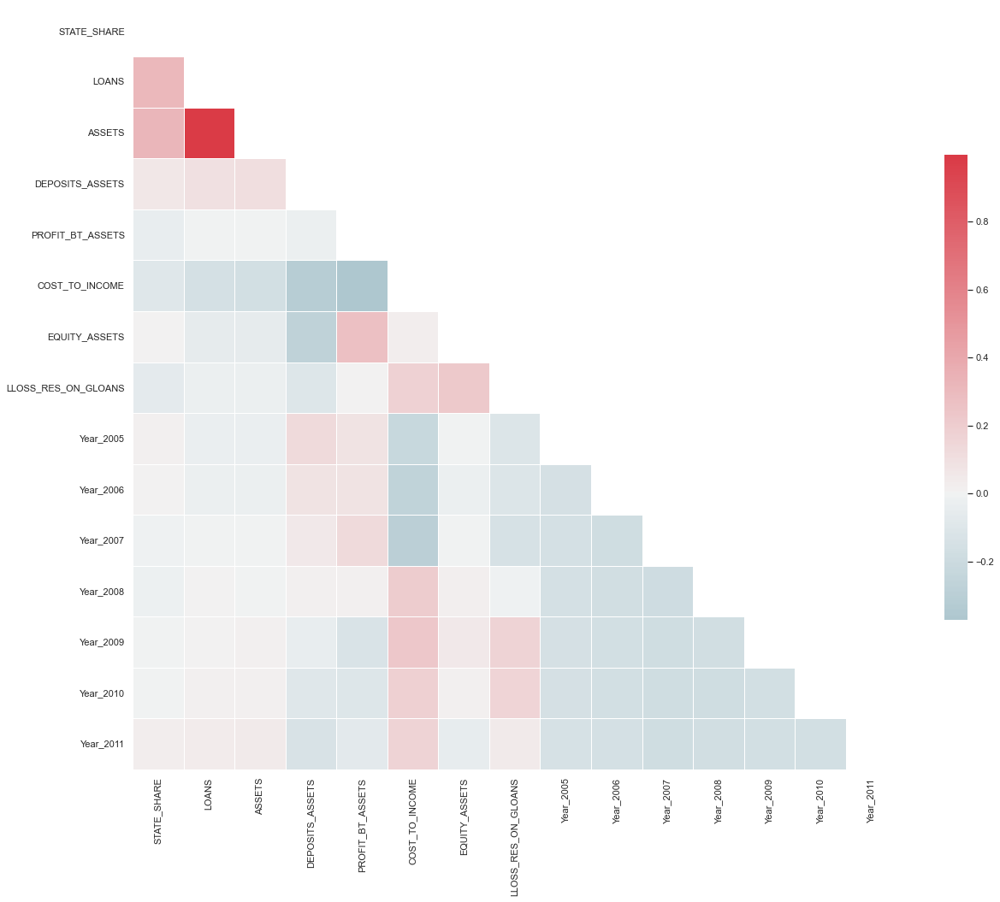

In [54]:
# One-hot encodes categorical variables
transformed_df = pd.get_dummies(df)
multi_collinearity_heatmap(transformed_df, figsize=(20,20))

C:\Users\arika\AppData\Local\Temp/ipykernel_3840/20349536.py:13: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


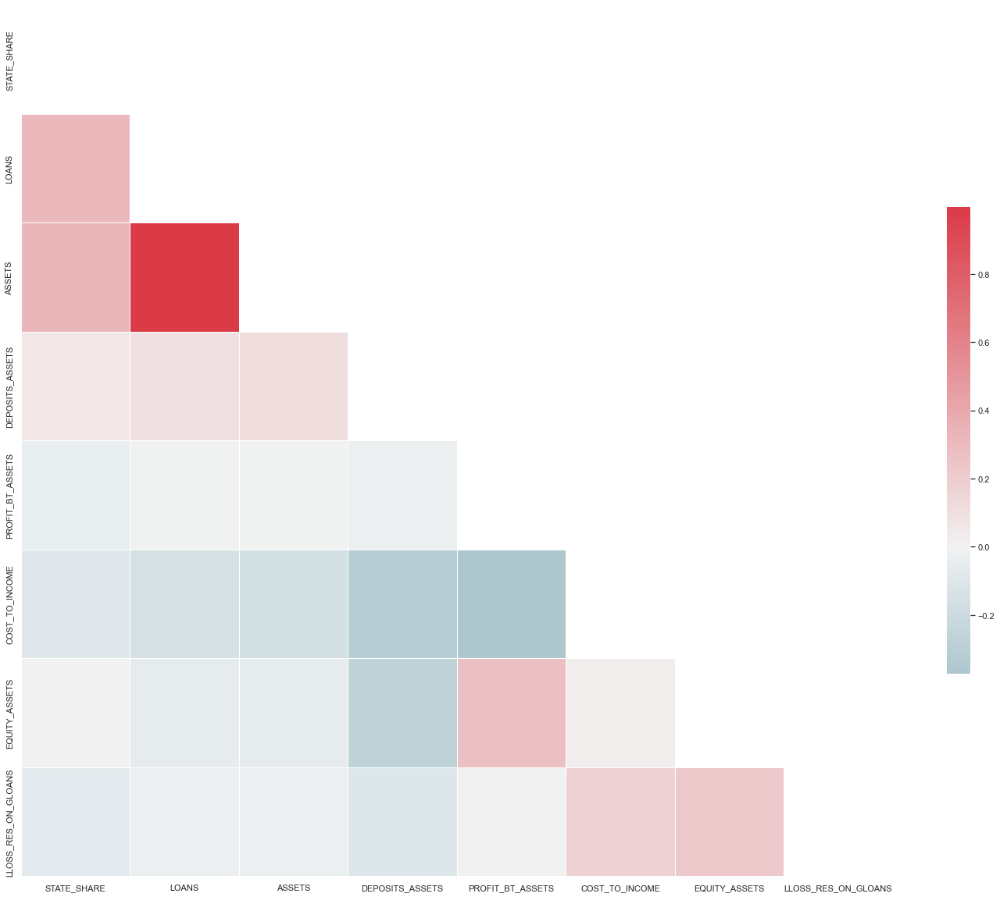

In [55]:
# Drop years to create a clearer heatmap
multi_collinearity_heatmap(transformed_df.drop(list(transformed_df.columns[transformed_df.columns.str.startswith('Year')]), axis=1), figsize=(25,22))


In [56]:
# Compare different models
from linearmodels.panel import compare
print(compare({"Pooled": pooled_res, "Random Effects": re_res, "Between OLS": be_res}))

                        Model Comparison                       
                            Pooled  Random Effects  Between OLS
---------------------------------------------------------------
Dep. Variable                LOANS           LOANS        LOANS
Estimator                PooledOLS   RandomEffects   BetweenOLS
No. Observations              2033            2033          342
Cov. Est.               Unadjusted      Unadjusted   Unadjusted
R-squared                   0.9910          0.9816       0.9941
R-Squared (Within)          0.9671          0.9680       0.9642
R-Squared (Between)         0.9941          0.9937       0.9941
R-Squared (Overall)         0.9910          0.9908       0.9907
F-statistic               1.71e+04          8291.3       8025.9
P-value (F-stat)            0.0000          0.0000       0.0000
===================== ============ =============== ============
const                   -4.661e+05      -1.576e+05   -8.315e+05
                         (-2.5390)      

# Model comparisons
* [Source](https://bashtage.github.io/linearmodels/panel/examples/examples.html#Comparing-models)
```
                        Model Comparison                       
===============================================================
                            Pooled  Random Effects  Between OLS
---------------------------------------------------------------
Dep. Variable                LOANS           LOANS        LOANS
Estimator                PooledOLS   RandomEffects   BetweenOLS
No. Observations              2033            2033          342
Cov. Est.               Unadjusted      Unadjusted   Unadjusted
R-squared                   0.9910          0.9816       0.9941
R-Squared (Within)          0.9671          0.9680       0.9642
R-Squared (Between)         0.9941          0.9937       0.9941
R-Squared (Overall)         0.9910          0.9908       0.9907
F-statistic               1.71e+04          8291.3       8025.9
P-value (F-stat)            0.0000          0.0000       0.0000
===================== ============ =============== ============
const                   -4.661e+05      -1.576e+05   -8.315e+05
                         (-2.5390)       (-0.8135)    (-2.0478)
STATE_SHARE                -3532.9         -772.21      -4256.0
                         (-2.5988)       (-0.4328)    (-1.6965)
ASSETS                      0.6883          0.6779       0.6911
                          (437.43)        (317.11)     (217.58)
DEPOSITS_ASSETS         -1.791e+05      -3.314e+05   -7.423e+04
                         (-1.2826)       (-2.0017)    (-0.2633)
PROFIT_BT_ASSETS           -9121.9         -7924.3    -1.87e+04
                         (-0.5496)       (-0.5148)    (-0.4665)
COST_TO_INCOME              7951.9          5158.9       9601.7
                          (5.1978)        (3.4683)     (2.6898)
EQUITY_ASSETS            1.839e+05       1.255e+05    2.234e+05
                          (0.6671)        (0.3979)     (0.4274)
LLOSS_RES_ON_GLOANS         623.12         -2745.1       2410.7
                          (0.1965)       (-0.8168)     (0.3589)
Year.2006               -2.473e+04      -3.637e+04             
                         (-0.2724)       (-0.5247)             
Year.2007                3.736e+04       2.532e+04             
                          (0.4209)        (0.3695)             
Year.2008               -1.632e+05      -1.217e+05             
                         (-1.7125)       (-1.5901)             
Year.2009               -3.712e+05      -2.906e+05             
                         (-3.7748)       (-3.6042)             
Year.2010               -4.053e+05      -3.358e+05             
                         (-4.1666)       (-4.2065)             
Year.2011               -2.996e+05      -2.389e+05             
                         (-3.0707)       (-2.9813)             
---------------------------------------------------------------

T-stats reported in parentheses
```

## Descriptive statistics
* [Example](https://towardsdatascience.com/working-with-multi-index-pandas-dataframes-f64d2e2c3e02)

In [16]:
df_desc = df.copy()

In [ ]:
# Group by and get means
df_desc = df_desc.groupby([''])

In [10]:
print(df.describe)

<bound method NDFrame.describe of            STATE_SHARE         LOANS        ASSETS  DEPOSITS_ASSETS  \
Bank Year                                                             
201  2005    63.760000  6.209636e+07  8.731443e+07         0.830049   
     2006    63.800000  9.652529e+07  1.316570e+08         0.828939   
     2007    60.300000  1.597618e+08  2.007972e+08         0.803022   
     2008    61.580000  1.728323e+08  2.292849e+08         0.756741   
     2009    60.750000  1.608252e+08  2.349233e+08         0.790621   
     2010    60.300000  1.801163e+08  2.831169e+08         0.806509   
     2011    60.300000  2.397713e+08  3.365345e+08         0.803734   
202  2005    99.900000  2.033875e+07  3.748806e+07         0.615941   
     2006    99.900000  3.264960e+07  5.847458e+07         0.613496   
     2007    77.500000  7.008009e+07  1.108400e+08         0.560334   
     2008    77.470000  8.698316e+07  1.258458e+08         0.403121   
     2009    85.500000  7.637497e+07  1.193

In [8]:
import statsmodels.api as sm
from linearmodels.panel import PooledOLS

In [9]:
exog_vars = ["LOANS", "ASSETS", "DEPOSITS_ASSETS", "PROFIT_BT_ASSETS", "COST_TO_INCOME", "EQUITY_ASSETS"]
exog = sm.add_constant(df[exog_vars])
mod = PooledOLS(df.STATE_SHARE, exog)
pooled_res = mod.fit()
print(pooled_res)

                          PooledOLS Estimation Summary                          
Dep. Variable:            STATE_SHARE   R-squared:                        0.1131
Estimator:                  PooledOLS   R-squared (Between):              0.1321
No. Observations:                2033   R-squared (Within):              -0.1680
Date:                Thu, Mar 10 2022   R-squared (Overall):              0.1131
Time:                        11:07:48   Log-likelihood                   -8631.2
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      43.072
Entities:                         342   P-value                           0.0000
Avg Obs:                       5.9444   Distribution:                  F(6,2026)
Min Obs:                       1.0000                                           
Max Obs:                       7.0000   F-statistic (robust):             43.072
                            

In [10]:
df.describe

<bound method NDFrame.describe of            STATE_SHARE         LOANS        ASSETS  DEPOSITS_ASSETS  \
Bank Year                                                             
201  2005        63.76  6.209636e+07  8.731443e+07         0.830049   
     2006        63.80  9.652529e+07  1.316570e+08         0.828939   
     2007        60.30  1.597618e+08  2.007972e+08         0.803022   
     2008        61.58  1.728323e+08  2.292849e+08         0.756741   
     2009        60.75  1.608252e+08  2.349233e+08         0.790621   
...                ...           ...           ...              ...   
547  2010         0.00  4.750348e+04  3.867721e+05         0.732015   
548  2008         0.00  4.584689e+04  3.056119e+05         0.414634   
     2009         0.00  3.274292e+04  2.799145e+05         0.335238   
     2010         0.00  3.412420e+04  3.199472e+05         0.429700   
     2011         0.00  8.429592e+04  4.002969e+05         0.592644   

           PROFIT_BT_ASSETS  COST_TO_INCOM

In [25]:
df

,Bank,Year,STATE_SHARE,LOANS,ASSETS,DEPOSITS_ASSETS,PROFIT_BT_ASSETS,COST_TO_INCOME,EQUITY_ASSETS,LLOSS_RES_ON_GLOANS
0,201,2005,63.76,6.209636e+07,8.731443e+07,0.830049,3.486552,51.613,0.091945,4.950
1,201,2006,63.80,9.652529e+07,1.316570e+08,0.828939,3.144802,54.839,0.088997,3.817
2,201,2007,60.30,1.597618e+08,2.007972e+08,0.803022,2.835351,55.434,0.129280,2.764
3,201,2008,61.58,1.728323e+08,2.292849e+08,0.756741,1.928618,49.997,0.130086,3.831
4,201,2009,60.75,1.608252e+08,2.349233e+08,0.790621,0.420320,34.302,0.127377,10.651
...,...,...,...,...,...,...,...,...,...,...
2028,547,2010,0.00,4.750348e+04,3.867721e+05,0.732015,1.515302,92.842,0.049501,32.124
2029,548,2008,0.00,4.584689e+04,3.056119e+05,0.414634,1.403274,92.746,0.360396,17.615
2030,548,2009,0.00,3.274292e+04,2.799145e+05,0.335238,0.607977,99.060,0.395550,23.347
2031,548,2010,0.00,3.412420e+04,3.199472e+05,0.429700,2.133115,88.419,0.344067,23.754


In [26]:
df = df.pivot_table(
    values=[
        'STATE_SHARE',
        'LOANS', 'ASSETS',
        'DEPOSITS_ASSETS',
        'PROFIT_BT_ASSETS',
        'COST_TO_INCOME',
        'EQUITY_ASSETS',
        'LLOSS_RES_ON_GLOANS'
    ],
    index='Year',
    columns='Bank'
   
)

In [27]:
df

ASSETS                                                          \
Bank           201           202           203           204           205   
Year                                                                         
2005  8.731443e+07  3.748806e+07  1.534537e+07  1.981583e+06  1.791255e+06   
2006  1.316570e+08  5.847458e+07  2.942247e+07  7.009984e+06  6.040211e+06   
2007  2.007972e+08  1.108400e+08  3.864236e+07  1.452201e+07  1.301166e+07   
2008  2.292849e+08  1.258458e+08           NaN  2.427176e+07  2.030201e+07   
2009  2.349233e+08  1.193882e+08  5.756945e+07  2.746523e+07  2.357387e+07   
2010  2.831169e+08  1.407919e+08  6.403607e+07  3.054116e+07  2.966368e+07   
2011  3.365345e+08  2.108827e+08  7.695553e+07  3.989384e+07  3.655694e+07   

                                                                            \
Bank           207           208           209           210           211   
Year                                                                         
2005  8.538849e+06           NaN  7.402297e+06  2.971149e+06  4.694603e+06   
2006  1.450596e+07  9.376737e+06  1.115926e+07  4.158759e+06  1.136357e+07   
2007  2.151397e+07  1.499015e+07  1.662429e+07  8.107161e+06  1.809779e+07   
2008  2.727619e+07  2.027746e+07  1.724119e+07  9.455120e+06  2.107935e+07   
2009  2.728490e+07  1.594730e+07  1.525955e+07  9.162454e+06  1.695057e+07   
2010           NaN  1.886696e+07  1.491697e+07  1.739733e+07  1.667836e+07   
2011  3.292353e+07  2.397734e+07  2.315532e+07  2.056597e+07  1.879378e+07   

      ... STATE_SHARE                                               
Bank  ...         539  540  541  542  543  544  545  546  547  548  
Year  ...                                                           
2005  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  
2006  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  
2007  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  
2008  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
2009  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
2010  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
2011  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  0.0  

[7 rows x 2736 columns]

In [28]:
years = df.index.get_level_values('Year').to_list()

In [30]:
df['Year'] = pd.Categorical(years)

In [31]:
df

ASSETS                                                          \
Bank           201           202           203           204           205   
Year                                                                         
2005  8.731443e+07  3.748806e+07  1.534537e+07  1.981583e+06  1.791255e+06   
2006  1.316570e+08  5.847458e+07  2.942247e+07  7.009984e+06  6.040211e+06   
2007  2.007972e+08  1.108400e+08  3.864236e+07  1.452201e+07  1.301166e+07   
2008  2.292849e+08  1.258458e+08           NaN  2.427176e+07  2.030201e+07   
2009  2.349233e+08  1.193882e+08  5.756945e+07  2.746523e+07  2.357387e+07   
2010  2.831169e+08  1.407919e+08  6.403607e+07  3.054116e+07  2.966368e+07   
2011  3.365345e+08  2.108827e+08  7.695553e+07  3.989384e+07  3.655694e+07   

                                                                            \
Bank           207           208           209           210           211   
Year                                                                         
2005  8.538849e+06           NaN  7.402297e+06  2.971149e+06  4.694603e+06   
2006  1.450596e+07  9.376737e+06  1.115926e+07  4.158759e+06  1.136357e+07   
2007  2.151397e+07  1.499015e+07  1.662429e+07  8.107161e+06  1.809779e+07   
2008  2.727619e+07  2.027746e+07  1.724119e+07  9.455120e+06  2.107935e+07   
2009  2.728490e+07  1.594730e+07  1.525955e+07  9.162454e+06  1.695057e+07   
2010           NaN  1.886696e+07  1.491697e+07  1.739733e+07  1.667836e+07   
2011  3.292353e+07  2.397734e+07  2.315532e+07  2.056597e+07  1.879378e+07   

      ... STATE_SHARE                                          Year  
Bank  ...         540  541  542  543  544  545  546  547  548        
Year  ...                                                            
2005  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  2005  
2006  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  2006  
2007  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  2007  
2008  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2008  
2009  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2009  
2010  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2010  
2011  ...         0.0  0.0  0.0  0.0  0.0  0.0  0.0  NaN  0.0  2011  

[7 rows x 2737 columns]

In [32]:
from linearmodels import PooledOLS
import statsmodels.api as sm

In [35]:
exog = sm.tools.tools.add_constant(df['STATE_SHARE'])
endog = df['LOANS']
mod = PooledOLS(endog, exog)
pooledOLS_res = mod.fit(cov_type='clustered', cluster_entity=True)

# Store values for checking homoskedasticity graphically
fittedvals_pooled_OLS = pooledOLS_res.predict().fitted_values
residuals_pooled_OLS = pooledOLS_res.resids

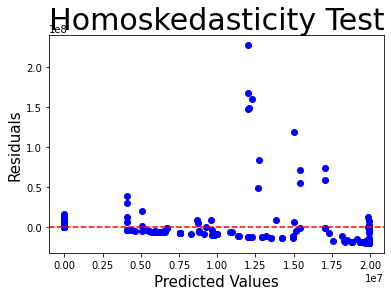

In [37]:
# 3A. Homoskedasticity
import matplotlib.pyplot as plt
 # 3A.1 Residuals-Plot for growing Variance Detection
fig, ax = plt.subplots()
ax.scatter(fittedvals_pooled_OLS, residuals_pooled_OLS, color = 'blue')
ax.axhline(0, color = 'r', ls = '--')
ax.set_xlabel('Predicted Values', fontsize = 15)
ax.set_ylabel('Residuals', fontsize = 15)
ax.set_title('Homoskedasticity Test', fontsize = 30)
plt.show()

In [14]:
dataset = pd.read_csv(
    'RIFA-Data2016.csv',
    usecols=[
        'STATE_SHARE',
        'LOANS', 'ASSETS',
        'DEPOSITS_ASSETS',
        'PROFIT_BT_ASSETS',
        'COST_TO_INCOME',
        'EQUITY_ASSETS',
        'LLOSS_RES_ON_GLOANS'
    ], index_col=['Bank', 'Year']
)


In [15]:
dataset

,Bank,Year,STATE_SHARE,LOANS,ASSETS,DEPOSITS_ASSETS,PROFIT_BT_ASSETS,COST_TO_INCOME,EQUITY_ASSETS,LLOSS_RES_ON_GLOANS
0,201,2005,63.76,62 096 356.32,87 314 430.88,0.83,3.49,51.61,0.09,4.95
1,201,2006,63.80,96 525 286.64,131 656 974.68,0.83,3.14,54.84,0.09,3.82
2,201,2007,60.30,159 761 834.08,200 797 187.11,0.80,2.84,55.43,0.13,2.76
3,201,2008,61.58,172 832 301.67,229 284 904.45,0.76,1.93,50.00,0.13,3.83
4,201,2009,60.75,160 825 246.60,234 923 254.31,0.79,0.42,34.30,0.13,10.65
...,...,...,...,...,...,...,...,...,...,...
2028,547,2010,0.00,47 503.48,386 772.06,0.73,1.52,92.84,0.05,32.12
2029,548,2008,0.00,45 846.89,305 611.91,0.41,1.40,92.75,0.36,17.62
2030,548,2009,0.00,32 742.92,279 914.51,0.34,0.61,99.06,0.40,23.35
2031,548,2010,0.00,34 124.20,319 947.23,0.43,2.13,88.42,0.34,23.75
